# Pix2Pix: Doodle-to-Real Image Translation and Colorization

**Objective:** Design and implement a paired image-to-image translation system using a conditional GAN (Pix2Pix) to convert:
- Sketch / Edge images → Realistic images (CUHK Face Sketch Dataset)
- Sketch images → Colored images (Anime Sketch Colorization Dataset)

**Architecture:** Pix2Pix with U-Net Generator + PatchGAN Discriminator

**Platform:** Kaggle (GPU T4, 15 GB VRAM)

## 1. Environment Setup & Imports

In [1]:
import os
import glob
import random
import numpy as np
from pathlib import Path

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms.functional as TF

from PIL import Image
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

from skimage.metrics import structural_similarity as compare_ssim
from skimage.metrics import peak_signal_noise_ratio as compare_psnr

# Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {DEVICE}')
if torch.cuda.is_available():
    print(f'GPU: {torch.cuda.get_device_name(0)}')
    print(f'VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB')

Using device: cuda
GPU: Tesla T4
VRAM: 15.6 GB


## 2. Configuration & Hyperparameters

In [2]:
# ---- Paths (auto-detect Kaggle vs local) ----
IS_KAGGLE = os.path.exists('/kaggle')

if IS_KAGGLE:
    CUHK_BASE  = '/kaggle/input/datasets/arbazkhan971/cuhk-face-sketch-database-cufs'
    ANIME_BASE = '/kaggle/input/datasets/ktaebum/anime-sketch-colorization-pair/data'
    OUTPUT_DIR = '/kaggle/working'
else:
    CUHK_BASE  = './data/cuhk'
    ANIME_BASE = './data/anime'
    OUTPUT_DIR = './output'

os.makedirs(OUTPUT_DIR, exist_ok=True)

# ---- Exact dataset paths (based on actual Kaggle structure) ----
# CUHK: single folder "cropped_sketch/" with 1194 side-by-side paired images
CUHK_DATA_DIR   = os.path.join(CUHK_BASE, 'cropped_sketch')

# Anime: "train/" and "val/" contain paired images; "colorgram/" is excluded
ANIME_TRAIN_DIR = os.path.join(ANIME_BASE, 'train')
ANIME_VAL_DIR   = os.path.join(ANIME_BASE, 'val')

# ---- Hyperparameters ----
IMAGE_SIZE      = 256        # Resize all images to 256x256
BATCH_SIZE      = 16         # Fits in 15 GB VRAM with mixed precision
LR              = 0.0002     # Adam learning rate
BETAS           = (0.5, 0.999)  # Adam betas
L1_LAMBDA       = 100        # Weight for L1 reconstruction loss
NUM_WORKERS     = 0          # 0 avoids multiprocessing issues on Kaggle

# Per-dataset training config
EPOCHS_CUHK     = 20        # Small dataset → more epochs
EPOCHS_ANIME    = 20        # Larger dataset → fewer epochs
ANIME_SUBSET    = 3000       # Use subset for faster training
CKPT_INTERVAL   = 10         # Save checkpoint every N epochs

print('Configuration ready.')
print(f'CUHK data dir  : {CUHK_DATA_DIR}')
print(f'Anime train dir: {ANIME_TRAIN_DIR}')
print(f'Anime val dir  : {ANIME_VAL_DIR}')

Configuration ready.
CUHK data dir  : /kaggle/input/datasets/arbazkhan971/cuhk-face-sketch-database-cufs/cropped_sketch
Anime train dir: /kaggle/input/datasets/ktaebum/anime-sketch-colorization-pair/data/train
Anime val dir  : /kaggle/input/datasets/ktaebum/anime-sketch-colorization-pair/data/val


## 3. Data Preparation (Part 1)

**Tasks:**
1. Load paired datasets (input sketch, target real/colored image)
2. Resize all images to 256 × 256
3. Normalize images to range [-1, 1]
4. Create PyTorch DataLoaders

In [3]:
# ---- Explore dataset directory structures ----
def show_tree(base_path, max_depth=3, max_files=5):
    """Print directory tree to understand dataset structure."""
    base_path = Path(base_path)
    if not base_path.exists():
        print(f'  [NOT FOUND] {base_path}')
        return
    for root, dirs, files in os.walk(base_path):
        depth = str(root).replace(str(base_path), '').count(os.sep)
        if depth >= max_depth:
            continue
        indent = '  ' * depth
        print(f'{indent}{os.path.basename(root)}/')
        sub_indent = '  ' * (depth + 1)
        for f in sorted(files)[:max_files]:
            print(f'{sub_indent}{f}')
        if len(files) > max_files:
            print(f'{sub_indent}... ({len(files)} files total)')

print('=== CUHK Face Sketch Dataset ===')
show_tree(CUHK_BASE)
print()
print('=== Anime Sketch Colorization Dataset ===')
show_tree(ANIME_BASE)

# ---- Inspect a sample CUHK image to detect pair layout ----
sample_paths = sorted(glob.glob(os.path.join(CUHK_DATA_DIR, '*.jpg')))
if sample_paths:
    sample = Image.open(sample_paths[0])
    w, h = sample.size
    print(f'\nCUHK sample image size: {w} x {h}  (w/h ratio: {w/h:.2f})')
    if w > 1.5 * h:
        print('  → Detected SIDE-BY-SIDE paired images (will split left/right)')
    else:
        print('  → Detected INDIVIDUAL images (will pair first-half / second-half)')
else:
    print('\n[WARNING] No CUHK images found — check CUHK_DATA_DIR path')

=== CUHK Face Sketch Dataset ===
cuhk-face-sketch-database-cufs/
  sketch_points/
    00001.3pts
    00002.3pts
    00003.3pts
    00004.3pts
    00005.3pts
    ... (1194 files total)
  photos/
    f-005-01.jpg
    f-006-01.jpg
    f-007-01.jpg
    f-008-01.jpg
    f-009-01.jpg
    ... (188 files total)
  cropped_sketch/
    00001.jpg
    00002.jpg
    00003.jpg
    00004.jpg
    00005.jpg
    ... (1194 files total)
  sketch/
    f-039-01-sz1.dat
    f-040-01-sz1.dat
    f-041-01-sz1.dat
    f-042-01-sz1.dat
    f-043-01-sz1.dat
    ... (188 files total)
  photo_points/
    00001fb010_930831.3pts
    00002fa010_930831.3pts
    00003fa010_930831.3pts
    00004fb010_930831.3pts
    00005fa010_930831.3pts
    ... (1194 files total)
  sketches/
    F2-005-01-sz1.jpg
    F2-006-01-sz1.jpg
    F2-007-01-sz1.jpg
    F2-008-01-sz1.jpg
    F2-009-01-sz1.jpg
    ... (188 files total)
  photo/
    f-005-01.dat
    f-005-01.jpg
    f-006-01.dat
    f-006-01.jpg
    f-007-01.dat
    ... (376 files 

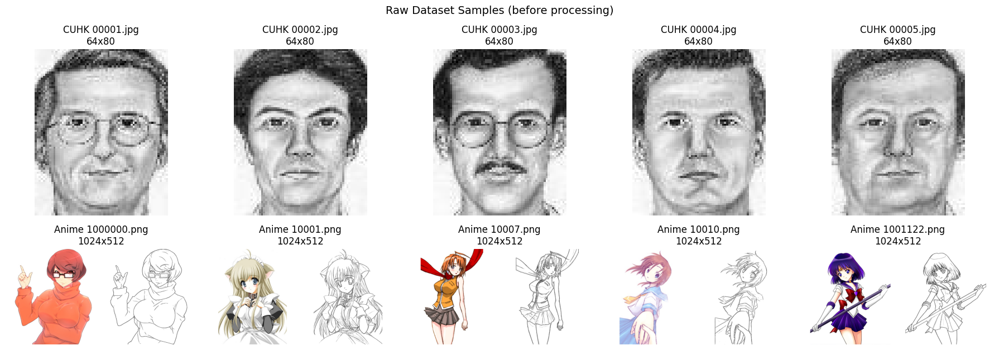

In [4]:
# ---- Preview raw images from both datasets ----
fig, axes = plt.subplots(2, 5, figsize=(18, 7))
fig.suptitle('Raw Dataset Samples (before processing)', fontsize=14)

# CUHK samples
cuhk_paths = sorted(glob.glob(os.path.join(CUHK_DATA_DIR, '*.jpg')))[:5]
for i, p in enumerate(cuhk_paths):
    img = Image.open(p)
    axes[0, i].imshow(np.array(img), cmap='gray')
    axes[0, i].set_title(f'CUHK {os.path.basename(p)}\n{img.size[0]}x{img.size[1]}')
    axes[0, i].axis('off')

# Anime samples
anime_paths = sorted(glob.glob(os.path.join(ANIME_TRAIN_DIR, '*.png')))[:5]
if not anime_paths:
    anime_paths = sorted(glob.glob(os.path.join(ANIME_TRAIN_DIR, '*.jpg')))[:5]
for i, p in enumerate(anime_paths):
    img = Image.open(p)
    axes[1, i].imshow(np.array(img))
    axes[1, i].set_title(f'Anime {os.path.basename(p)[:15]}\n{img.size[0]}x{img.size[1]}')
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

In [5]:
# ============================================================
# CUHK Face Sketch Dataset
# Structure: single "cropped_sketch/" folder with 1194 images
# Auto-detects whether images are side-by-side pairs or
# individual images (first half = sketch, second half = photo).
# ============================================================
class CUHKFaceSketchDataset(Dataset):
    """
    Loads paired sketch-photo images from the CUHK Face Sketch Database.
    Handles two possible layouts:
      1) Side-by-side pairs (width > 1.5 * height) → split left/right
      2) Individual images → pair first-half (photos) with second-half (sketches)
    """
    def __init__(self, data_dir, image_size=256, augment=True):
        super().__init__()
        self.image_size = image_size
        self.augment = augment

        img_exts = ('*.jpg', '*.jpeg', '*.png', '*.bmp')
        all_paths = []
        for ext in img_exts:
            all_paths.extend(glob.glob(os.path.join(data_dir, ext)))
        all_paths = sorted(all_paths)

        # Detect layout from the first image
        sample = Image.open(all_paths[0])
        w, h = sample.size
        self.is_paired = (w > 1.5 * h)  # side-by-side pair

        if self.is_paired:
            # Each image is a concatenated pair
            self.image_paths = all_paths
            print(f'[CUHK] Found {len(all_paths)} side-by-side paired images '
                  f'({w}x{h} each). Will split left/right.')
        else:
            # Individual images: first half = photos, second half = sketches
            n = len(all_paths)
            half = n // 2
            photos   = all_paths[:half]
            sketches = all_paths[half:half + len(photos)]
            self.pairs = list(zip(sketches, photos))
            self.image_paths = None
            print(f'[CUHK] Found {n} individual images ({w}x{h} each). '
                  f'Paired first {half} (photos) with last {half} (sketches) → {len(self.pairs)} pairs.')

    def __len__(self):
        if self.is_paired:
            return len(self.image_paths)
        return len(self.pairs)

    def __getitem__(self, idx):
        if self.is_paired:
            img = Image.open(self.image_paths[idx]).convert('RGB')
            w, h = img.size
            # Split: left half = photo, right half = sketch
            photo  = img.crop((0, 0, w // 2, h))
            sketch = img.crop((w // 2, 0, w, h))
        else:
            sketch_path, photo_path = self.pairs[idx]
            sketch = Image.open(sketch_path).convert('RGB')
            photo  = Image.open(photo_path).convert('RGB')

        # Resize to target size
        sketch = sketch.resize((self.image_size, self.image_size), Image.BICUBIC)
        photo  = photo.resize((self.image_size, self.image_size), Image.BICUBIC)

        # Data augmentation: random horizontal flip (same for both)
        if self.augment and random.random() > 0.5:
            sketch = TF.hflip(sketch)
            photo  = TF.hflip(photo)

        # To tensor [0,1] → normalize to [-1,1]
        sketch = TF.to_tensor(sketch)
        photo  = TF.to_tensor(photo)
        sketch = TF.normalize(sketch, [0.5]*3, [0.5]*3)
        photo  = TF.normalize(photo,  [0.5]*3, [0.5]*3)

        return {'input': sketch, 'target': photo}

In [6]:
# ============================================================
# Anime Sketch Colorization Dataset
# Structure: data/train/ and data/val/ contain side-by-side
#   paired images [colored | sketch].  data/colorgram/ is excluded.
# ============================================================
class AnimeSketchDataset(Dataset):
    """
    Loads paired sketch-color images from the Anime Sketch Colorization dataset.
    Each image file contains two halves: colored (left) and sketch (right).
    """
    def __init__(self, data_dir, image_size=256, augment=True, max_samples=None):
        super().__init__()
        self.image_size = image_size
        self.augment = augment

        img_exts = ('*.jpg', '*.jpeg', '*.png', '*.bmp')
        self.image_paths = []
        for ext in img_exts:
            self.image_paths.extend(glob.glob(os.path.join(data_dir, ext)))
        self.image_paths = sorted(self.image_paths)

        if max_samples and len(self.image_paths) > max_samples:
            random.shuffle(self.image_paths)
            self.image_paths = self.image_paths[:max_samples]
            self.image_paths.sort()

        print(f'[Anime] Loaded {len(self.image_paths)} paired images from {data_dir}')

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = Image.open(self.image_paths[idx]).convert('RGB')
        w, h = img.size

        # Split into two halves: left = colored, right = sketch
        colored = img.crop((0, 0, w // 2, h))
        sketch  = img.crop((w // 2, 0, w, h))

        # Resize
        sketch  = sketch.resize((self.image_size, self.image_size), Image.BICUBIC)
        colored = colored.resize((self.image_size, self.image_size), Image.BICUBIC)

        # Augmentation
        if self.augment and random.random() > 0.5:
            sketch  = TF.hflip(sketch)
            colored = TF.hflip(colored)

        # To tensor and normalize to [-1, 1]
        sketch  = TF.to_tensor(sketch)
        colored = TF.to_tensor(colored)
        sketch  = TF.normalize(sketch,  [0.5]*3, [0.5]*3)
        colored = TF.normalize(colored, [0.5]*3, [0.5]*3)

        return {'input': sketch, 'target': colored}

In [7]:
# ---- Create Datasets and DataLoaders ----

# CUHK Face Sketch — single folder, auto-detects pair layout
cuhk_dataset = CUHKFaceSketchDataset(
    data_dir=CUHK_DATA_DIR,
    image_size=IMAGE_SIZE,
    augment=True
)
cuhk_loader = DataLoader(
    cuhk_dataset, batch_size=BATCH_SIZE, shuffle=True,
    num_workers=NUM_WORKERS, pin_memory=True, drop_last=True
)

# Anime Sketch Colorization — use train/ folder only (excludes colorgram/)
anime_dataset = AnimeSketchDataset(
    data_dir=ANIME_TRAIN_DIR,
    image_size=IMAGE_SIZE,
    augment=True,
    max_samples=ANIME_SUBSET
)
anime_loader = DataLoader(
    anime_dataset, batch_size=BATCH_SIZE, shuffle=True,
    num_workers=NUM_WORKERS, pin_memory=True, drop_last=True
)

# Anime validation set (for evaluation)
anime_val_dataset = AnimeSketchDataset(
    data_dir=ANIME_VAL_DIR,
    image_size=IMAGE_SIZE,
    augment=False,
    max_samples=500
)
anime_val_loader = DataLoader(
    anime_val_dataset, batch_size=BATCH_SIZE, shuffle=False,
    num_workers=NUM_WORKERS, pin_memory=True
)

print(f'\nCUHK  : {len(cuhk_dataset)} pairs  → {len(cuhk_loader)} batches/epoch')
print(f'Anime : {len(anime_dataset)} pairs → {len(anime_loader)} batches/epoch  (train)')
print(f'Anime : {len(anime_val_dataset)} pairs → {len(anime_val_loader)} batches       (val)')

[CUHK] Found 1194 individual images (64x80 each). Paired first 597 (photos) with last 597 (sketches) → 597 pairs.
[Anime] Loaded 3000 paired images from /kaggle/input/datasets/ktaebum/anime-sketch-colorization-pair/data/train
[Anime] Loaded 500 paired images from /kaggle/input/datasets/ktaebum/anime-sketch-colorization-pair/data/val

CUHK  : 597 pairs  → 37 batches/epoch
Anime : 3000 pairs → 187 batches/epoch  (train)
Anime : 500 pairs → 32 batches       (val)


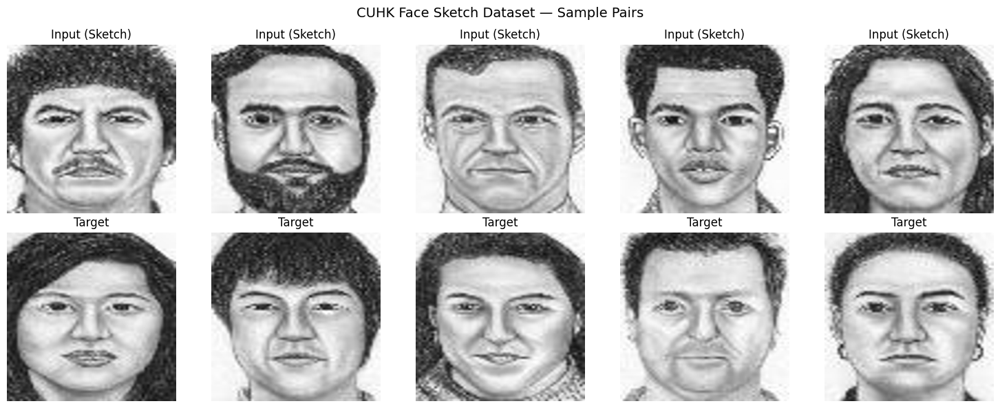

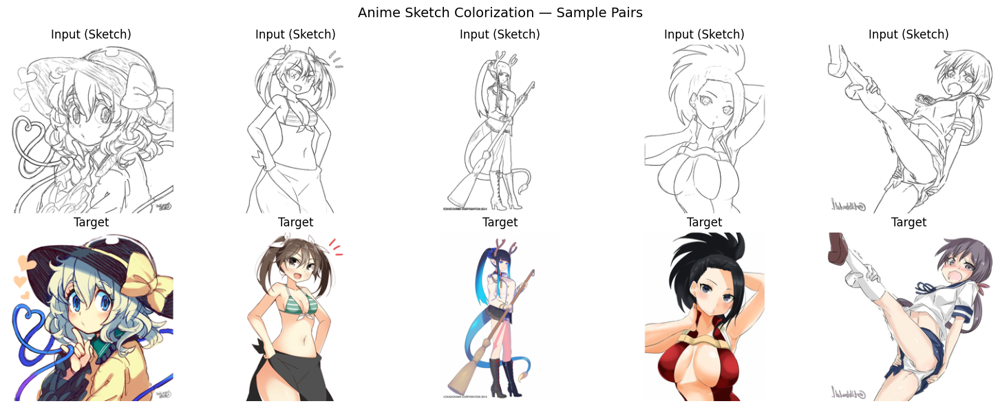

In [8]:
# ---- Visualize sample pairs from both datasets ----
def show_pairs(dataloader, title, n=5):
    """Display n sample pairs: input sketch | target image."""
    batch = next(iter(dataloader))
    fig, axes = plt.subplots(2, n, figsize=(3*n, 6))
    fig.suptitle(title, fontsize=14)
    for i in range(n):
        # Denormalize: [-1,1] → [0,1]
        inp = batch['input'][i].cpu().numpy().transpose(1, 2, 0) * 0.5 + 0.5
        tgt = batch['target'][i].cpu().numpy().transpose(1, 2, 0) * 0.5 + 0.5
        axes[0, i].imshow(np.clip(inp, 0, 1))
        axes[0, i].set_title('Input (Sketch)')
        axes[0, i].axis('off')
        axes[1, i].imshow(np.clip(tgt, 0, 1))
        axes[1, i].set_title('Target')
        axes[1, i].axis('off')
    plt.tight_layout()
    plt.show()

show_pairs(cuhk_loader, 'CUHK Face Sketch Dataset — Sample Pairs', n=5)
show_pairs(anime_loader, 'Anime Sketch Colorization — Sample Pairs', n=5)

## 4. Model Architecture

### 4.1 Generator — U-Net with Skip Connections

The generator uses an encoder-decoder architecture with **skip connections** between corresponding encoder and decoder layers. This preserves spatial structure and fine details from the input sketch.

- **Encoder:** 8 downsampling layers (Conv2d, stride 2)
- **Decoder:** 7 upsampling layers (ConvTranspose2d, stride 2) + final output layer
- **Skip connections:** Concatenate encoder features to decoder at each level
- **Output activation:** Tanh (maps output to [-1, 1])

In [9]:
# ============================================================
# U-Net Generator
# ============================================================

class UNetDown(nn.Module):
    """Encoder block: Conv → [BN] → LeakyReLU."""
    def __init__(self, in_ch, out_ch, normalize=True):
        super().__init__()
        layers = [nn.Conv2d(in_ch, out_ch, kernel_size=4, stride=2, padding=1, bias=False)]
        if normalize:
            layers.append(nn.BatchNorm2d(out_ch))
        layers.append(nn.LeakyReLU(0.2, inplace=True))
        self.block = nn.Sequential(*layers)

    def forward(self, x):
        return self.block(x)


class UNetUp(nn.Module):
    """Decoder block: ConvTranspose → BN → ReLU → [Dropout]."""
    def __init__(self, in_ch, out_ch, dropout=False):
        super().__init__()
        layers = [
            nn.ConvTranspose2d(in_ch, out_ch, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        ]
        if dropout:
            layers.append(nn.Dropout(0.5))
        self.block = nn.Sequential(*layers)

    def forward(self, x, skip):
        x = self.block(x)
        return torch.cat([x, skip], dim=1)  # Skip connection


class UNetGenerator(nn.Module):
    """
    U-Net Generator for Pix2Pix.
    Input:  (B, in_ch, 256, 256)
    Output: (B, out_ch, 256, 256)
    """
    def __init__(self, in_channels=3, out_channels=3):
        super().__init__()
        # ---------- Encoder ----------
        self.down1 = UNetDown(in_channels, 64, normalize=False)   # 256→128
        self.down2 = UNetDown(64, 128)                             # 128→64
        self.down3 = UNetDown(128, 256)                            # 64→32
        self.down4 = UNetDown(256, 512)                            # 32→16
        self.down5 = UNetDown(512, 512)                            # 16→8
        self.down6 = UNetDown(512, 512)                            # 8→4
        self.down7 = UNetDown(512, 512)                            # 4→2
        self.down8 = UNetDown(512, 512, normalize=False)           # 2→1  (bottleneck)

        # ---------- Decoder (with skip connections) ----------
        self.up1 = UNetUp(512,  512, dropout=True)   # 1→2,   cat→1024
        self.up2 = UNetUp(1024, 512, dropout=True)   # 2→4,   cat→1024
        self.up3 = UNetUp(1024, 512, dropout=True)   # 4→8,   cat→1024
        self.up4 = UNetUp(1024, 512)                  # 8→16,  cat→1024
        self.up5 = UNetUp(1024, 256)                  # 16→32, cat→512
        self.up6 = UNetUp(512,  128)                  # 32→64, cat→256
        self.up7 = UNetUp(256,  64)                   # 64→128,cat→128

        # Final layer: 128→256, output channels
        self.final = nn.Sequential(
            nn.ConvTranspose2d(128, out_channels, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )

    def forward(self, x):
        # Encoder
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)
        d5 = self.down5(d4)
        d6 = self.down6(d5)
        d7 = self.down7(d6)
        d8 = self.down8(d7)  # Bottleneck

        # Decoder with skip connections
        u1 = self.up1(d8, d7)
        u2 = self.up2(u1, d6)
        u3 = self.up3(u2, d5)
        u4 = self.up4(u3, d4)
        u5 = self.up5(u4, d3)
        u6 = self.up6(u5, d2)
        u7 = self.up7(u6, d1)

        return self.final(u7)


# Quick test
_g = UNetGenerator().to(DEVICE)
_x = torch.randn(1, 3, 256, 256, device=DEVICE)
print(f'Generator output shape: {_g(_x).shape}')  # (1, 3, 256, 256)
del _g, _x
torch.cuda.empty_cache()

Generator output shape: torch.Size([1, 3, 256, 256])


### 4.2 Discriminator — PatchGAN (16 × 16 patches)

The discriminator uses **patch-based classification**, outputting a 16 × 16 matrix of probabilities. Each value indicates whether the corresponding patch of the image is real or fake. This encourages the generator to produce locally realistic textures.

In [10]:
# ============================================================
# PatchGAN Discriminator (16×16 output)
# ============================================================

class PatchGANDiscriminator(nn.Module):
    """
    PatchGAN Discriminator for Pix2Pix.
    Input:  concatenation of input image + target/generated image → (B, 6, 256, 256)
    Output: (B, 1, 16, 16) — matrix of patch-level real/fake probabilities.
    """
    def __init__(self, in_channels=6):
        super().__init__()
        self.model = nn.Sequential(
            # Layer 1: (6, 256, 256) → (64, 128, 128)   — no BatchNorm
            nn.Conv2d(in_channels, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            # Layer 2: (64, 128, 128) → (128, 64, 64)
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            # Layer 3: (128, 64, 64) → (256, 32, 32)
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            # Layer 4: (256, 32, 32) → (512, 16, 16)
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            # Output: (512, 16, 16) → (1, 16, 16)
            nn.Conv2d(512, 1, kernel_size=3, stride=1, padding=1),
        )

    def forward(self, input_img, target_img):
        # Concatenate input and target along channel dimension
        x = torch.cat([input_img, target_img], dim=1)
        return self.model(x)


# Quick test
_d = PatchGANDiscriminator().to(DEVICE)
_a = torch.randn(1, 3, 256, 256, device=DEVICE)
_b = torch.randn(1, 3, 256, 256, device=DEVICE)
print(f'Discriminator output shape: {_d(_a, _b).shape}')  # (1, 1, 16, 16)
del _d, _a, _b
torch.cuda.empty_cache()

Discriminator output shape: torch.Size([1, 1, 16, 16])


In [11]:
# ---- Weight Initialization ----
def init_weights(model):
    """Initialize Conv and BatchNorm weights as in the Pix2Pix paper."""
    for m in model.modules():
        classname = m.__class__.__name__
        if 'Conv' in classname:
            nn.init.normal_(m.weight.data, 0.0, 0.02)
            if m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif 'BatchNorm' in classname:
            nn.init.normal_(m.weight.data, 1.0, 0.02)
            nn.init.constant_(m.bias.data, 0.0)

print('Weight init function ready.')

Weight init function ready.


## 5. Training Setup (Part 2 & 3)

**Loss Functions:**
- **Adversarial Loss (GAN Loss):** BCEWithLogitsLoss — classifies patches as real/fake
- **L1 Loss (Reconstruction Loss):** Pixel-level reconstruction to preserve structure
- **Total Generator Loss:** `L_G = L_adv + λ × L1`  (λ = 100)

**Optimizer:** Adam with lr=0.0002, betas=(0.5, 0.999)

**Mixed Precision:** `torch.cuda.amp` for efficient GPU memory usage on T4

In [12]:
# ============================================================
# Training Function (with Mixed Precision)
# ============================================================

def train_pix2pix(generator, discriminator, dataloader, num_epochs,
                  device=DEVICE, lr=LR, betas=BETAS, l1_lambda=L1_LAMBDA,
                  ckpt_prefix='model', ckpt_interval=CKPT_INTERVAL):
    """
    Train Pix2Pix model with mixed precision.
    Returns (g_losses, d_losses, g_adv_losses, g_l1_losses) per epoch.
    """
    # Loss functions
    criterion_gan = nn.BCEWithLogitsLoss()
    criterion_l1  = nn.L1Loss()

    # Optimizers
    opt_g = optim.Adam(generator.parameters(),     lr=lr, betas=betas)
    opt_d = optim.Adam(discriminator.parameters(),  lr=lr, betas=betas)

    # Mixed-precision scalers
    scaler_g = torch.cuda.amp.GradScaler()
    scaler_d = torch.cuda.amp.GradScaler()

    g_losses, d_losses = [], []
    g_adv_losses, g_l1_losses = [], []   # Track adversarial & L1 separately

    for epoch in range(num_epochs):
        generator.train()
        discriminator.train()
        epoch_g, epoch_d = 0.0, 0.0
        epoch_g_adv, epoch_g_l1 = 0.0, 0.0

        pbar = tqdm(dataloader, desc=f'Epoch {epoch+1}/{num_epochs}', leave=False)
        for batch in pbar:
            input_img  = batch['input'].to(device)
            target_img = batch['target'].to(device)

            # -------- Generate fake image --------
            with torch.cuda.amp.autocast():
                fake_img = generator(input_img)

            # ======== Train Discriminator ========
            opt_d.zero_grad(set_to_none=True)
            with torch.cuda.amp.autocast():
                # Real pair
                pred_real = discriminator(input_img, target_img)
                loss_d_real = criterion_gan(pred_real, torch.ones_like(pred_real))
                # Fake pair (detach generator output)
                pred_fake = discriminator(input_img, fake_img.detach())
                loss_d_fake = criterion_gan(pred_fake, torch.zeros_like(pred_fake))
                # Total D loss
                loss_d = 0.5 * (loss_d_real + loss_d_fake)

            scaler_d.scale(loss_d).backward()
            scaler_d.step(opt_d)
            scaler_d.update()

            # ======== Train Generator ========
            opt_g.zero_grad(set_to_none=True)
            with torch.cuda.amp.autocast():
                # Adversarial loss: fool the discriminator
                pred_fake_g = discriminator(input_img, fake_img)
                loss_g_gan = criterion_gan(pred_fake_g, torch.ones_like(pred_fake_g))
                # L1 reconstruction loss
                loss_g_l1 = criterion_l1(fake_img, target_img)
                # Total G loss
                loss_g = loss_g_gan + l1_lambda * loss_g_l1

            scaler_g.scale(loss_g).backward()
            scaler_g.step(opt_g)
            scaler_g.update()

            epoch_g += loss_g.item()
            epoch_d += loss_d.item()
            epoch_g_adv += loss_g_gan.item()
            epoch_g_l1  += loss_g_l1.item()
            pbar.set_postfix(G=f'{loss_g.item():.3f}', D=f'{loss_d.item():.3f}',
                             Adv=f'{loss_g_gan.item():.3f}', L1=f'{loss_g_l1.item():.3f}')

        # Epoch averages
        n_batches = len(dataloader)
        avg_g = epoch_g / n_batches
        avg_d = epoch_d / n_batches
        avg_g_adv = epoch_g_adv / n_batches
        avg_g_l1  = epoch_g_l1 / n_batches
        g_losses.append(avg_g)
        d_losses.append(avg_d)
        g_adv_losses.append(avg_g_adv)
        g_l1_losses.append(avg_g_l1)

        print(f'Epoch [{epoch+1}/{num_epochs}]  G_Loss: {avg_g:.4f}  D_Loss: {avg_d:.4f}  '
              f'Adv: {avg_g_adv:.4f}  L1: {avg_g_l1:.4f}')

        # Save checkpoint
        if (epoch + 1) % ckpt_interval == 0:
            ckpt_path = os.path.join(OUTPUT_DIR, f'{ckpt_prefix}_epoch_{epoch+1}.pth')
            torch.save({
                'epoch': epoch + 1,
                'generator': generator.state_dict(),
                'discriminator': discriminator.state_dict(),
                'opt_g': opt_g.state_dict(),
                'opt_d': opt_d.state_dict(),
            }, ckpt_path)
            print(f'  → Checkpoint saved: {ckpt_path}')

    # Save final model
    final_path = os.path.join(OUTPUT_DIR, f'{ckpt_prefix}_final.pth')
    torch.save({
        'epoch': num_epochs,
        'generator': generator.state_dict(),
        'discriminator': discriminator.state_dict(),
    }, final_path)
    print(f'Final model saved: {final_path}')

    return g_losses, d_losses, g_adv_losses, g_l1_losses

### 5.1 Train on CUHK Face Sketch Dataset

**Task:** Sketch → Realistic Face Photo

In [13]:
# ---- Initialize models for CUHK ----
gen_cuhk  = UNetGenerator(in_channels=3, out_channels=3).to(DEVICE)
disc_cuhk = PatchGANDiscriminator(in_channels=6).to(DEVICE)

init_weights(gen_cuhk)
init_weights(disc_cuhk)

# Model parameter counts
g_params = sum(p.numel() for p in gen_cuhk.parameters())
d_params = sum(p.numel() for p in disc_cuhk.parameters())
print(f'Generator parameters:     {g_params:,}')
print(f'Discriminator parameters: {d_params:,}')

# ---- Train ----
print(f'\nTraining Pix2Pix on CUHK Face Sketch ({EPOCHS_CUHK} epochs)...')
cuhk_g_losses, cuhk_d_losses, cuhk_adv_losses, cuhk_l1_losses = train_pix2pix(
    generator=gen_cuhk,
    discriminator=disc_cuhk,
    dataloader=cuhk_loader,
    num_epochs=EPOCHS_CUHK,
    ckpt_prefix='cuhk_pix2pix',
    ckpt_interval=CKPT_INTERVAL
)

Generator parameters:     54,413,955
Discriminator parameters: 2,765,121

Training Pix2Pix on CUHK Face Sketch (20 epochs)...


/tmp/ipykernel_55/1688141566.py:21: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler_g = torch.cuda.amp.GradScaler()
/tmp/ipykernel_55/1688141566.py:22: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler_d = torch.cuda.amp.GradScaler()


Epoch 1/20:   0%|          | 0/37 [00:00<?, ?it/s]

/tmp/ipykernel_55/1688141566.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/tmp/ipykernel_55/1688141566.py:44: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/tmp/ipykernel_55/1688141566.py:60: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch [1/20]  G_Loss: 43.0086  D_Loss: 0.5159  Adv: 1.2723  L1: 0.4174


Epoch 2/20:   0%|          | 0/37 [00:00<?, ?it/s]

Epoch [2/20]  G_Loss: 32.9921  D_Loss: 0.4307  Adv: 1.4316  L1: 0.3156


Epoch 3/20:   0%|          | 0/37 [00:00<?, ?it/s]

Epoch [3/20]  G_Loss: 32.1093  D_Loss: 0.4734  Adv: 1.3333  L1: 0.3078


Epoch 4/20:   0%|          | 0/37 [00:00<?, ?it/s]

Epoch [4/20]  G_Loss: 32.3091  D_Loss: 0.3547  Adv: 1.5939  L1: 0.3072


Epoch 5/20:   0%|          | 0/37 [00:00<?, ?it/s]

Epoch [5/20]  G_Loss: 32.1419  D_Loss: 0.4073  Adv: 1.6411  L1: 0.3050


Epoch 6/20:   0%|          | 0/37 [00:00<?, ?it/s]

Epoch [6/20]  G_Loss: 32.2922  D_Loss: 0.3672  Adv: 1.6229  L1: 0.3067


Epoch 7/20:   0%|          | 0/37 [00:00<?, ?it/s]

Epoch [7/20]  G_Loss: 32.1494  D_Loss: 0.3919  Adv: 1.6089  L1: 0.3054


Epoch 8/20:   0%|          | 0/37 [00:00<?, ?it/s]

Epoch [8/20]  G_Loss: 31.7357  D_Loss: 0.3985  Adv: 1.5789  L1: 0.3016


Epoch 9/20:   0%|          | 0/37 [00:00<?, ?it/s]

Epoch [9/20]  G_Loss: 31.5384  D_Loss: 0.4066  Adv: 1.5457  L1: 0.2999


Epoch 10/20:   0%|          | 0/37 [00:00<?, ?it/s]

Epoch [10/20]  G_Loss: 30.8405  D_Loss: 0.4312  Adv: 1.5744  L1: 0.2927
  → Checkpoint saved: /kaggle/working/cuhk_pix2pix_epoch_10.pth


Epoch 11/20:   0%|          | 0/37 [00:00<?, ?it/s]

Epoch [11/20]  G_Loss: 30.8357  D_Loss: 0.4101  Adv: 1.5460  L1: 0.2929


Epoch 12/20:   0%|          | 0/37 [00:00<?, ?it/s]

Epoch [12/20]  G_Loss: 30.0362  D_Loss: 0.4008  Adv: 1.5348  L1: 0.2850


Epoch 13/20:   0%|          | 0/37 [00:00<?, ?it/s]

Epoch [13/20]  G_Loss: 29.5395  D_Loss: 0.4253  Adv: 1.5605  L1: 0.2798


Epoch 14/20:   0%|          | 0/37 [00:00<?, ?it/s]

Epoch [14/20]  G_Loss: 29.2327  D_Loss: 0.4125  Adv: 1.4662  L1: 0.2777


Epoch 15/20:   0%|          | 0/37 [00:00<?, ?it/s]

Epoch [15/20]  G_Loss: 28.7833  D_Loss: 0.4326  Adv: 1.5274  L1: 0.2726


Epoch 16/20:   0%|          | 0/37 [00:00<?, ?it/s]

Epoch [16/20]  G_Loss: 28.1493  D_Loss: 0.4406  Adv: 1.5118  L1: 0.2664


Epoch 17/20:   0%|          | 0/37 [00:00<?, ?it/s]

Epoch [17/20]  G_Loss: 27.2938  D_Loss: 0.4327  Adv: 1.4716  L1: 0.2582


Epoch 18/20:   0%|          | 0/37 [00:00<?, ?it/s]

Epoch [18/20]  G_Loss: 27.2777  D_Loss: 0.4298  Adv: 1.4264  L1: 0.2585


Epoch 19/20:   0%|          | 0/37 [00:00<?, ?it/s]

Epoch [19/20]  G_Loss: 26.8905  D_Loss: 0.4282  Adv: 1.4192  L1: 0.2547


Epoch 20/20:   0%|          | 0/37 [00:00<?, ?it/s]

Epoch [20/20]  G_Loss: 26.0458  D_Loss: 0.4561  Adv: 1.4453  L1: 0.2460
  → Checkpoint saved: /kaggle/working/cuhk_pix2pix_epoch_20.pth
Final model saved: /kaggle/working/cuhk_pix2pix_final.pth


### 5.2 Train on Anime Sketch Colorization Dataset

**Task:** Sketch → Colored Anime Image

In [14]:
# Free CUHK model memory (keep weights saved on disk)
gen_cuhk_state  = gen_cuhk.state_dict()   # Keep in CPU RAM for later eval
disc_cuhk_state = disc_cuhk.state_dict()
del gen_cuhk, disc_cuhk
torch.cuda.empty_cache()

# ---- Initialize models for Anime ----
gen_anime  = UNetGenerator(in_channels=3, out_channels=3).to(DEVICE)
disc_anime = PatchGANDiscriminator(in_channels=6).to(DEVICE)

init_weights(gen_anime)
init_weights(disc_anime)

# ---- Train ----
print(f'Training Pix2Pix on Anime Sketch Colorization ({EPOCHS_ANIME} epochs)...')
anime_g_losses, anime_d_losses, anime_adv_losses, anime_l1_losses = train_pix2pix(
    generator=gen_anime,
    discriminator=disc_anime,
    dataloader=anime_loader,
    num_epochs=EPOCHS_ANIME,
    ckpt_prefix='anime_pix2pix',
    ckpt_interval=CKPT_INTERVAL
)

Training Pix2Pix on Anime Sketch Colorization (20 epochs)...


/tmp/ipykernel_55/1688141566.py:21: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler_g = torch.cuda.amp.GradScaler()
/tmp/ipykernel_55/1688141566.py:22: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler_d = torch.cuda.amp.GradScaler()


Epoch 1/20:   0%|          | 0/187 [00:00<?, ?it/s]

/tmp/ipykernel_55/1688141566.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/tmp/ipykernel_55/1688141566.py:44: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/tmp/ipykernel_55/1688141566.py:60: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch [1/20]  G_Loss: 29.9173  D_Loss: 0.2965  Adv: 2.2268  L1: 0.2769


Epoch 2/20:   0%|          | 0/187 [00:00<?, ?it/s]

Epoch [2/20]  G_Loss: 22.1040  D_Loss: 0.3882  Adv: 1.8876  L1: 0.2022


Epoch 3/20:   0%|          | 0/187 [00:00<?, ?it/s]

Epoch [3/20]  G_Loss: 20.6583  D_Loss: 0.4774  Adv: 1.5275  L1: 0.1913


Epoch 4/20:   0%|          | 0/187 [00:00<?, ?it/s]

Epoch [4/20]  G_Loss: 19.8040  D_Loss: 0.5365  Adv: 1.3088  L1: 0.1850


Epoch 5/20:   0%|          | 0/187 [00:00<?, ?it/s]

Epoch [5/20]  G_Loss: 19.1415  D_Loss: 0.5470  Adv: 1.2499  L1: 0.1789


Epoch 6/20:   0%|          | 0/187 [00:00<?, ?it/s]

Epoch [6/20]  G_Loss: 18.7964  D_Loss: 0.5447  Adv: 1.2294  L1: 0.1757


Epoch 7/20:   0%|          | 0/187 [00:00<?, ?it/s]

Epoch [7/20]  G_Loss: 18.4857  D_Loss: 0.5474  Adv: 1.2217  L1: 0.1726


Epoch 8/20:   0%|          | 0/187 [00:00<?, ?it/s]

Epoch [8/20]  G_Loss: 18.2168  D_Loss: 0.5479  Adv: 1.2443  L1: 0.1697


Epoch 9/20:   0%|          | 0/187 [00:00<?, ?it/s]

Epoch [9/20]  G_Loss: 17.9411  D_Loss: 0.5341  Adv: 1.2592  L1: 0.1668


Epoch 10/20:   0%|          | 0/187 [00:00<?, ?it/s]

Epoch [10/20]  G_Loss: 17.6396  D_Loss: 0.5331  Adv: 1.3137  L1: 0.1633
  → Checkpoint saved: /kaggle/working/anime_pix2pix_epoch_10.pth


Epoch 11/20:   0%|          | 0/187 [00:00<?, ?it/s]

Epoch [11/20]  G_Loss: 17.4076  D_Loss: 0.5099  Adv: 1.3653  L1: 0.1604


Epoch 12/20:   0%|          | 0/187 [00:00<?, ?it/s]

Epoch [12/20]  G_Loss: 17.0356  D_Loss: 0.5097  Adv: 1.3723  L1: 0.1566


Epoch 13/20:   0%|          | 0/187 [00:00<?, ?it/s]

Epoch [13/20]  G_Loss: 16.7972  D_Loss: 0.5045  Adv: 1.3907  L1: 0.1541


Epoch 14/20:   0%|          | 0/187 [00:00<?, ?it/s]

Epoch [14/20]  G_Loss: 16.5260  D_Loss: 0.4967  Adv: 1.4180  L1: 0.1511


Epoch 15/20:   0%|          | 0/187 [00:00<?, ?it/s]

Epoch [15/20]  G_Loss: 16.2802  D_Loss: 0.4804  Adv: 1.4630  L1: 0.1482


Epoch 16/20:   0%|          | 0/187 [00:00<?, ?it/s]

Epoch [16/20]  G_Loss: 15.9737  D_Loss: 0.5035  Adv: 1.4471  L1: 0.1453


Epoch 17/20:   0%|          | 0/187 [00:00<?, ?it/s]

Epoch [17/20]  G_Loss: 15.6099  D_Loss: 0.4750  Adv: 1.4699  L1: 0.1414


Epoch 18/20:   0%|          | 0/187 [00:00<?, ?it/s]

Epoch [18/20]  G_Loss: 15.4570  D_Loss: 0.4834  Adv: 1.4740  L1: 0.1398


Epoch 19/20:   0%|          | 0/187 [00:00<?, ?it/s]

Epoch [19/20]  G_Loss: 15.1219  D_Loss: 0.5077  Adv: 1.4802  L1: 0.1364


Epoch 20/20:   0%|          | 0/187 [00:00<?, ?it/s]

Epoch [20/20]  G_Loss: 14.7265  D_Loss: 0.5101  Adv: 1.4164  L1: 0.1331
  → Checkpoint saved: /kaggle/working/anime_pix2pix_epoch_20.pth
Final model saved: /kaggle/working/anime_pix2pix_final.pth


## 6. Training Logs

Plot Generator Loss and Discriminator Loss vs. Epochs for both models.

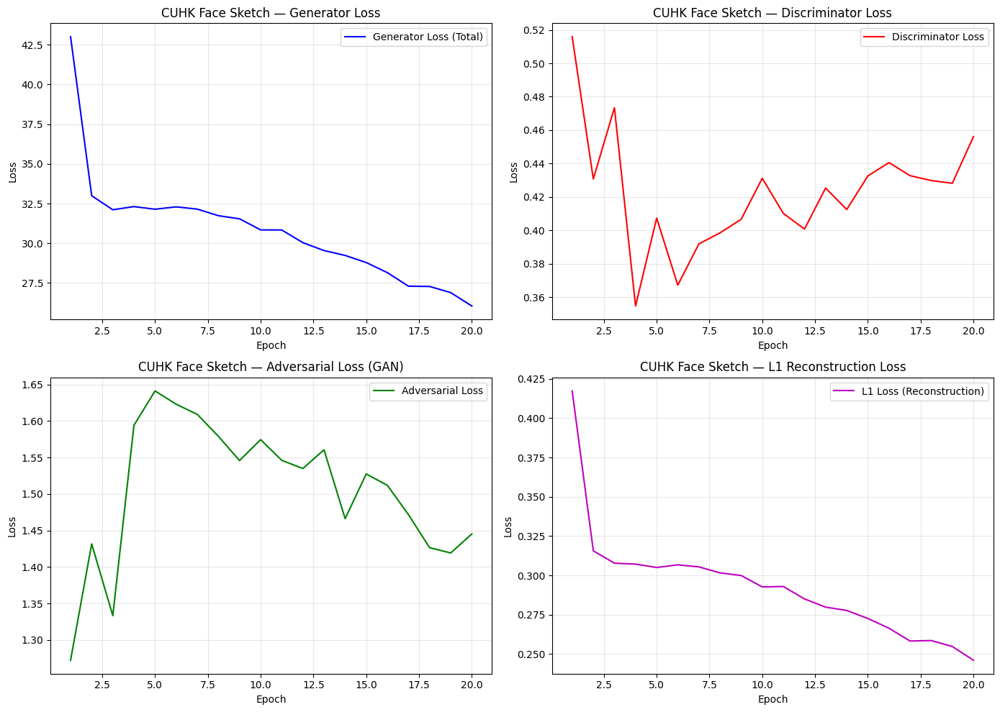

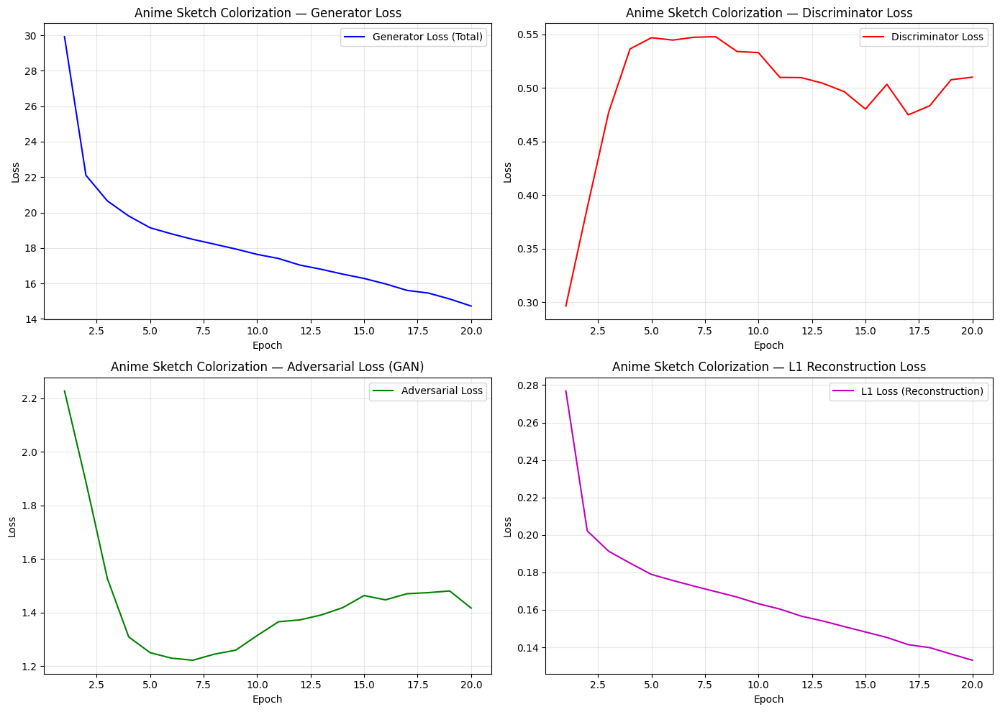

In [15]:
def plot_losses(g_losses, d_losses, adv_losses, l1_losses, title):
    """Plot Generator Loss, Discriminator Loss, Adversarial Loss, and L1 Loss over epochs."""
    epochs = range(1, len(g_losses) + 1)
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    # Generator Total Loss
    axes[0, 0].plot(epochs, g_losses, 'b-', label='Generator Loss (Total)')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Loss')
    axes[0, 0].set_title(f'{title} — Generator Loss')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)

    # Discriminator Loss
    axes[0, 1].plot(epochs, d_losses, 'r-', label='Discriminator Loss')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('Loss')
    axes[0, 1].set_title(f'{title} — Discriminator Loss')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)

    # Adversarial Loss (GAN Loss component of G)
    axes[1, 0].plot(epochs, adv_losses, 'g-', label='Adversarial Loss')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Loss')
    axes[1, 0].set_title(f'{title} — Adversarial Loss (GAN)')
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)

    # L1 Reconstruction Loss
    axes[1, 1].plot(epochs, l1_losses, 'm-', label='L1 Loss (Reconstruction)')
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].set_ylabel('Loss')
    axes[1, 1].set_title(f'{title} — L1 Reconstruction Loss')
    axes[1, 1].legend()
    axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, f'{title.replace(" ", "_")}_losses.png'), dpi=150)
    plt.show()

plot_losses(cuhk_g_losses, cuhk_d_losses, cuhk_adv_losses, cuhk_l1_losses, 'CUHK Face Sketch')
plot_losses(anime_g_losses, anime_d_losses, anime_adv_losses, anime_l1_losses, 'Anime Sketch Colorization')

## 7. Visualization Module

Display **Input Sketch**, **Generated Output**, and **Ground Truth** side-by-side for at least 10 samples per model.

In [16]:
def visualize_results(generator, dataloader, title, device=DEVICE, n_samples=10):
    """
    Generate and display n_samples results:
    Input Sketch | Generated Image | Ground Truth
    """
    generator.eval()
    inputs, outputs, targets = [], [], []

    with torch.no_grad():
        for batch in dataloader:
            inp = batch['input'].to(device)
            tgt = batch['target'].to(device)
            with torch.cuda.amp.autocast():
                out = generator(inp)
            inputs.append(inp.cpu())
            outputs.append(out.float().cpu())
            targets.append(tgt.cpu())
            if sum(x.size(0) for x in inputs) >= n_samples:
                break

    inputs  = torch.cat(inputs)[:n_samples]
    outputs = torch.cat(outputs)[:n_samples]
    targets = torch.cat(targets)[:n_samples]

    fig, axes = plt.subplots(n_samples, 3, figsize=(12, 4 * n_samples))
    fig.suptitle(title, fontsize=16, y=1.01)

    for i in range(n_samples):
        inp_np = inputs[i].numpy().transpose(1, 2, 0) * 0.5 + 0.5
        out_np = outputs[i].numpy().transpose(1, 2, 0) * 0.5 + 0.5
        tgt_np = targets[i].numpy().transpose(1, 2, 0) * 0.5 + 0.5

        axes[i, 0].imshow(np.clip(inp_np, 0, 1))
        axes[i, 0].set_title('Input Sketch')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(np.clip(out_np, 0, 1))
        axes[i, 1].set_title('Generated Output')
        axes[i, 1].axis('off')

        axes[i, 2].imshow(np.clip(tgt_np, 0, 1))
        axes[i, 2].set_title('Ground Truth')
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, f'{title.replace(" ", "_")}_results.png'), dpi=150, bbox_inches='tight')
    plt.show()
    generator.train()

print('Visualization function ready.')

Visualization function ready.


/tmp/ipykernel_55/4018039519.py:13: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


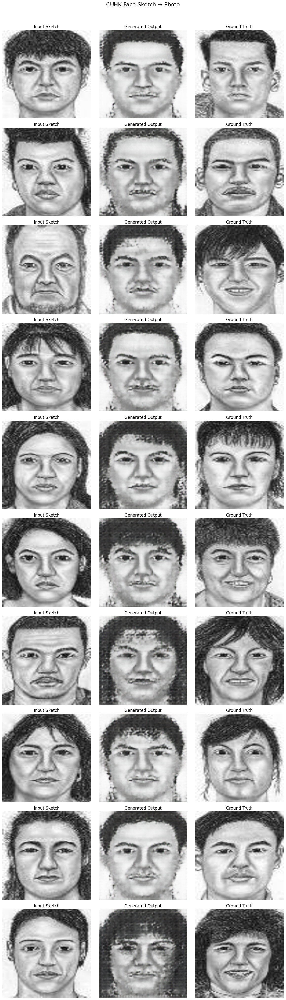

In [17]:
# ---- Visualize CUHK Face Sketch results ----

# Reload CUHK generator for visualization
gen_cuhk_viz = UNetGenerator(in_channels=3, out_channels=3).to(DEVICE)
gen_cuhk_viz.load_state_dict(gen_cuhk_state)

visualize_results(gen_cuhk_viz, cuhk_loader, 'CUHK Face Sketch → Photo', n_samples=10)

del gen_cuhk_viz
torch.cuda.empty_cache()

/tmp/ipykernel_55/4018039519.py:13: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


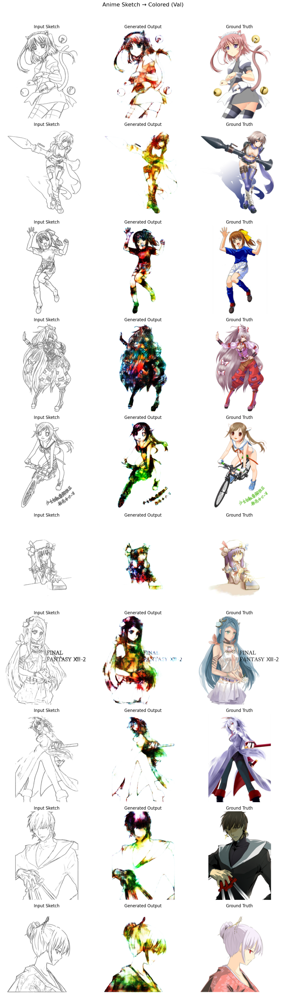

In [18]:
# ---- Visualize Anime Colorization results (on validation set) ----

visualize_results(gen_anime, anime_val_loader, 'Anime Sketch → Colored (Val)', n_samples=10)

## 8. Quantitative Evaluation

Compute:
- **SSIM (Structural Similarity Index):** Measures perceived structural similarity (higher = better, max 1.0)
- **PSNR (Peak Signal-to-Noise Ratio):** Measures pixel-level reconstruction quality in dB (higher = better)

In [19]:
def evaluate_metrics(generator, dataloader, device=DEVICE, max_samples=100):
    """
    Compute SSIM and PSNR between generated and ground truth images.
    Returns (mean_ssim, mean_psnr, all_ssim, all_psnr).
    """
    generator.eval()
    ssim_scores, psnr_scores = [], []
    count = 0

    with torch.no_grad():
        for batch in tqdm(dataloader, desc='Evaluating', leave=False):
            inp = batch['input'].to(device)
            tgt = batch['target'].to(device)

            with torch.cuda.amp.autocast():
                gen = generator(inp)

            # Denormalize to [0, 1]
            gen_np = (gen.float().cpu().numpy() * 0.5 + 0.5).clip(0, 1)
            tgt_np = (tgt.cpu().numpy() * 0.5 + 0.5).clip(0, 1)

            for j in range(gen_np.shape[0]):
                if count >= max_samples:
                    break
                g_img = gen_np[j].transpose(1, 2, 0)  # CHW → HWC
                t_img = tgt_np[j].transpose(1, 2, 0)

                ssim_val = compare_ssim(t_img, g_img, channel_axis=2, data_range=1.0)
                psnr_val = compare_psnr(t_img, g_img, data_range=1.0)

                ssim_scores.append(ssim_val)
                psnr_scores.append(psnr_val)
                count += 1

            if count >= max_samples:
                break

    generator.train()
    return np.mean(ssim_scores), np.mean(psnr_scores), ssim_scores, psnr_scores


print('Evaluation function ready.')

Evaluation function ready.


In [20]:
# ---- Evaluate CUHK Face Sketch model ----
gen_cuhk_eval = UNetGenerator(in_channels=3, out_channels=3).to(DEVICE)
gen_cuhk_eval.load_state_dict(gen_cuhk_state)

cuhk_ssim, cuhk_psnr, cuhk_ssim_all, cuhk_psnr_all = evaluate_metrics(
    gen_cuhk_eval, cuhk_loader, max_samples=len(cuhk_dataset)
)
print(f'\n=== CUHK Face Sketch → Photo ===')
print(f'  SSIM : {cuhk_ssim:.4f}')
print(f'  PSNR : {cuhk_psnr:.2f} dB')

del gen_cuhk_eval
torch.cuda.empty_cache()

Evaluating:   0%|          | 0/37 [00:00<?, ?it/s]

/tmp/ipykernel_55/1920925921.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():



=== CUHK Face Sketch → Photo ===
  SSIM : 0.4080
  PSNR : 15.10 dB


In [21]:
# ---- Evaluate Anime Colorization model (on VALIDATION set) ----
anime_ssim, anime_psnr, anime_ssim_all, anime_psnr_all = evaluate_metrics(
    gen_anime, anime_val_loader, max_samples=500
)
print(f'\n=== Anime Sketch → Colored (Validation Set) ===')
print(f'  SSIM : {anime_ssim:.4f}')
print(f'  PSNR : {anime_psnr:.2f} dB')

Evaluating:   0%|          | 0/32 [00:00<?, ?it/s]

/tmp/ipykernel_55/1920925921.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():



=== Anime Sketch → Colored (Validation Set) ===
  SSIM : 0.7108
  PSNR : 12.43 dB



Model                                   SSIM  PSNR (dB)
-------------------------------------------------------
CUHK Face (Sketch → Photo)            0.4080      15.10
Anime (Sketch → Colored)              0.7108      12.43


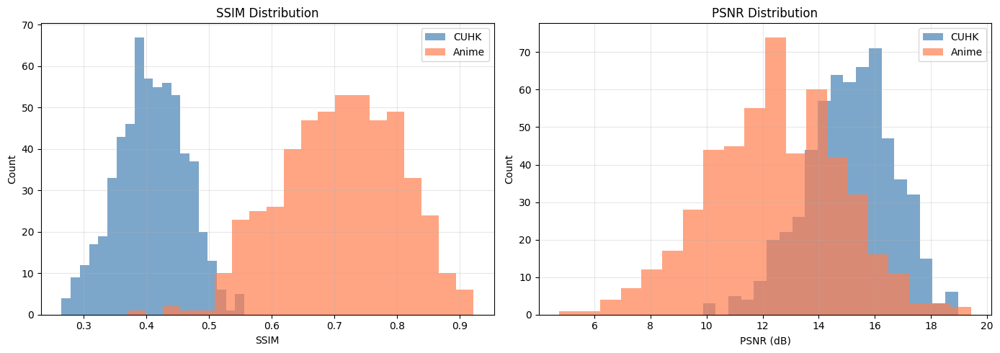

In [22]:
# ---- Summary Table ----
print('\n' + '='*55)
print(f'{"Model":<35} {"SSIM":>8} {"PSNR (dB)":>10}')
print('-'*55)
print(f'{"CUHK Face (Sketch → Photo)":<35} {cuhk_ssim:>8.4f} {cuhk_psnr:>10.2f}')
print(f'{"Anime (Sketch → Colored)":<35} {anime_ssim:>8.4f} {anime_psnr:>10.2f}')
print('='*55)

# ---- Distribution plots ----
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(cuhk_ssim_all, bins=20, alpha=0.7, label='CUHK', color='steelblue')
axes[0].hist(anime_ssim_all, bins=20, alpha=0.7, label='Anime', color='coral')
axes[0].set_xlabel('SSIM')
axes[0].set_ylabel('Count')
axes[0].set_title('SSIM Distribution')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].hist(cuhk_psnr_all, bins=20, alpha=0.7, label='CUHK', color='steelblue')
axes[1].hist(anime_psnr_all, bins=20, alpha=0.7, label='Anime', color='coral')
axes[1].set_xlabel('PSNR (dB)')
axes[1].set_ylabel('Count')
axes[1].set_title('PSNR Distribution')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'evaluation_metrics.png'), dpi=150)
plt.show()

## 9. Gradio Interface

A Gradio application that:
- Accepts sketch / grayscale input image upload
- Generates realistic or colored image using the trained Pix2Pix generator
- Displays results in real-time

In [23]:
# ---- Save generator weights for Gradio app ----
torch.save(gen_cuhk_state, os.path.join(OUTPUT_DIR, 'cuhk_generator.pth'))

anime_gen_state = gen_anime.state_dict()
torch.save(anime_gen_state, os.path.join(OUTPUT_DIR, 'anime_generator.pth'))

print('Generator weights saved for Gradio app.')

Generator weights saved for Gradio app.


In [24]:
# ---- Gradio Interface (runs inline in the notebook) ----

!pip install -q gradio

import gradio as gr

# ---- Load generators ----
device_gr = 'cuda' if torch.cuda.is_available() else 'cpu'

gen_cuhk_gr = UNetGenerator(in_channels=3, out_channels=3).to(device_gr)
gen_cuhk_gr.load_state_dict(torch.load(os.path.join(OUTPUT_DIR, 'cuhk_generator.pth'), map_location=device_gr))
gen_cuhk_gr.eval()

gen_anime_gr = UNetGenerator(in_channels=3, out_channels=3).to(device_gr)
gen_anime_gr.load_state_dict(torch.load(os.path.join(OUTPUT_DIR, 'anime_generator.pth'), map_location=device_gr))
gen_anime_gr.eval()

generators = {
    'Face Sketch → Photo (CUHK)': gen_cuhk_gr,
    'Anime Sketch → Colored': gen_anime_gr,
}

def translate(input_image, task):
    """Take a sketch image and generate a realistic / colored output."""
    if input_image is None:
        return None

    # Preprocess: PIL → tensor [-1, 1]
    img = Image.fromarray(input_image).convert('RGB')
    img = img.resize((256, 256), Image.BICUBIC)
    tensor = TF.to_tensor(img)
    tensor = TF.normalize(tensor, [0.5]*3, [0.5]*3).unsqueeze(0).to(device_gr)

    # Generate
    gen = generators[task]
    with torch.no_grad():
        with torch.cuda.amp.autocast():
            output = gen(tensor)

    # Postprocess: tensor → numpy [0, 255]
    output = output.squeeze().float().cpu().numpy()
    output = (output * 0.5 + 0.5).clip(0, 1)
    output = (np.transpose(output, (1, 2, 0)) * 255).astype(np.uint8)
    return output

# ---- Build Gradio App ----
demo = gr.Interface(
    fn=translate,
    inputs=[
        gr.Image(label='Upload Sketch Image', type='numpy'),
        gr.Radio(
            choices=['Face Sketch → Photo (CUHK)', 'Anime Sketch → Colored'],
            value='Face Sketch → Photo (CUHK)',
            label='Select Task'
        ),
    ],
    outputs=gr.Image(label='Generated Image', type='numpy'),
    title='Pix2Pix: Sketch to Image Translation & Colorization',
    description='Upload a sketch or edge image and the model will generate a realistic photo or colored version in real-time.',
    examples=None,
    allow_flagging='never',
)

demo.launch(share=True, debug=False)
print('Gradio app launched!')

/usr/local/lib/python3.12/dist-packages/gradio/interface.py:415: UserWarning: The `allow_flagging` parameter in `Interface` is deprecated. Use `flagging_mode` instead.
  warnings.warn(


* Running on local URL:  http://127.0.0.1:7860
* Running on public URL: https://ae7d018a0836d98e80.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Gradio app launched!


In [25]:
# ---- Final Cleanup ----
print('\n' + '='*60)
print(' TRAINING AND EVALUATION COMPLETE')
print('='*60)
print(f'\nAll outputs saved to: {OUTPUT_DIR}')
print(f'  - cuhk_pix2pix_final.pth    (CUHK model checkpoint)')
print(f'  - anime_pix2pix_final.pth   (Anime model checkpoint)')
print(f'  - cuhk_generator.pth        (Generator weights for app)')
print(f'  - anime_generator.pth       (Generator weights for app)')
print(f'  - *_losses.png              (Training loss plots)')
print(f'  - *_results.png             (Visualization results)')
print(f'  - evaluation_metrics.png    (SSIM/PSNR distributions)')
print(f'  - Gradio interface          (Launched inline above)')
print(f'\nQuantitative Results:')
print(f'  CUHK  — SSIM: {cuhk_ssim:.4f}  PSNR: {cuhk_psnr:.2f} dB')
print(f'  Anime — SSIM: {anime_ssim:.4f}  PSNR: {anime_psnr:.2f} dB')


 TRAINING AND EVALUATION COMPLETE

All outputs saved to: /kaggle/working
  - cuhk_pix2pix_final.pth    (CUHK model checkpoint)
  - anime_pix2pix_final.pth   (Anime model checkpoint)
  - cuhk_generator.pth        (Generator weights for app)
  - anime_generator.pth       (Generator weights for app)
  - *_losses.png              (Training loss plots)
  - *_results.png             (Visualization results)
  - evaluation_metrics.png    (SSIM/PSNR distributions)
  - Gradio interface          (Launched inline above)

Quantitative Results:
  CUHK  — SSIM: 0.4080  PSNR: 15.10 dB
  Anime — SSIM: 0.7108  PSNR: 12.43 dB
